<a href="https://colab.research.google.com/github/TrinhHoangKhang/Math-for-AI/blob/main/5.%20Image%20retrieval/Vector_database.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Dowload dataset
!gdown 1msLVo0g0LFmL9-qZ73vq9YEVZwbzOePF
!unzip data

# Dowload packages
!pip install open-clip-torch
!pip install chromadb

Downloading...
From (original): https://drive.google.com/uc?id=1msLVo0g0LFmL9-qZ73vq9YEVZwbzOePF
From (redirected): https://drive.google.com/uc?id=1msLVo0g0LFmL9-qZ73vq9YEVZwbzOePF&confirm=t&uuid=e85f6e43-6df6-4a4c-b539-da47b9d12bea
To: /content/data.zip
100% 76.1M/76.1M [00:00<00:00, 213MB/s]
Archive:  data.zip
replace data/test/American_egret/n02009912_2473.JPEG? [y]es, [n]o, [A]ll, [N]one, [r]ename: Requirement already satisfied: open-clip-torch in /usr/local/lib/python3.10/dist-packages (2.26.1)


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
from chromadb.utils.embedding_functions import OpenCLIPEmbeddingFunction
from PIL import Image
from tqdm import tqdm
import chromadb

In [3]:
embeddingFunction = OpenCLIPEmbeddingFunction()
def create_embedding_one_image(image):
  result = embeddingFunction._encode_image(image)
  return result

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:99: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


#### Helper function

In [4]:
POOL_PATH = '/content/data/train'
IMAGE_SIZE = (448, 448)

In [5]:
# A function to get all the train images's path
def get_all_train_path(pool_path):
  images_path = []
  for class_name in os.listdir(pool_path):
    class_path = os.path.join(pool_path, class_name)
    for image_name in os.listdir(class_path):
      image_path = os.path.join(class_path, image_name)
      images_path.append(image_path)
  return np.array(images_path)

# A function to read image
def read_img(path, size):
    im = Image.open(path).convert('RGB').resize(size)
    return np.array(im)

#### Create the vector database

In [6]:
def add_embedding(colection, files_path):
  ids = []
  embeddings = []
  for i, path in tqdm(enumerate(files_path)):
    image = read_img(path, IMAGE_SIZE)
    try:
      image_embedded = create_embedding_one_image(image)
    except:
      print("Error in this step")
    ids.append(f'id_{i}')
    embeddings.append(image_embedded)
    print(f'Added {path}')

  colection.add(
      ids=ids,
      embeddings=embeddings,
  )

L2 Norm

In [ ]:
# Create a Chroma client
chroma_client = chromadb.Client()
# Create a colection
l2_norm_collection = chroma_client.get_or_create_collection(
    name="l2_norm",
    metadata={"hnsw:space": "l2"},
)
# Add the vector to the collection
add_embedding(l2_norm_collection, get_all_train_path(POOL_PATH))

Cosine similarity

In [18]:
# Create a collection
cosine_similarity_collection = chroma_client.get_or_create_collection(
    name="cosine_similarity",
    metadata={"hnsw:space": "cosine"},
)
# Add the vector to the collection
add_embedding(cosine_similarity_collection, get_all_train_path(POOL_PATH))

1it [00:00,  2.45it/s]

Added /content/data/train/castle/n02980441_2971.JPEG


2it [00:00,  3.01it/s]

Added /content/data/train/castle/n02980441_2252.JPEG


3it [00:00,  3.38it/s]

Added /content/data/train/castle/n02980441_9457.JPEG


4it [00:01,  3.58it/s]

Added /content/data/train/castle/n02980441_1399.JPEG


5it [00:01,  3.73it/s]

Added /content/data/train/castle/n02980441_5253.JPEG


6it [00:01,  3.70it/s]

Added /content/data/train/castle/n02980441_16692.JPEG


7it [00:01,  3.83it/s]

Added /content/data/train/castle/n02980441_37573.JPEG


8it [00:02,  3.87it/s]

Added /content/data/train/castle/n02980441_4309.JPEG


9it [00:02,  3.88it/s]

Added /content/data/train/castle/n02980441_11635.JPEG


10it [00:02,  3.85it/s]

Added /content/data/train/castle/n02980441_2391.JPEG


11it [00:02,  3.92it/s]

Added /content/data/train/Doberman/n02107142_24759.JPEG


12it [00:03,  3.94it/s]

Added /content/data/train/Doberman/n02107142_10381.JPEG


13it [00:03,  3.95it/s]

Added /content/data/train/Doberman/n02107142_14933.JPEG


14it [00:03,  3.95it/s]

Added /content/data/train/Doberman/n02107142_49242.JPEG


15it [00:03,  3.95it/s]

Added /content/data/train/Doberman/n02107142_3654.JPEG


16it [00:04,  3.95it/s]

Added /content/data/train/Doberman/n02107142_3428.JPEG


17it [00:04,  3.93it/s]

Added /content/data/train/Doberman/n02107142_32921.JPEG


18it [00:04,  3.96it/s]

Added /content/data/train/Doberman/n02107142_47697.JPEG


19it [00:05,  3.93it/s]

Added /content/data/train/Doberman/n02107142_1596.JPEG


20it [00:05,  3.92it/s]

Added /content/data/train/Doberman/n02107142_4753.JPEG


21it [00:05,  3.88it/s]

Added /content/data/train/red-backed_sandpiper/n02027492_4687.JPEG


22it [00:05,  3.87it/s]

Added /content/data/train/red-backed_sandpiper/n02027492_10068.JPEG


23it [00:06,  3.80it/s]

Added /content/data/train/red-backed_sandpiper/n02027492_5299.JPEG


24it [00:06,  3.86it/s]

Added /content/data/train/red-backed_sandpiper/n02027492_7527.JPEG


25it [00:06,  3.85it/s]

Added /content/data/train/red-backed_sandpiper/n02027492_5565.JPEG


26it [00:06,  3.92it/s]

Added /content/data/train/red-backed_sandpiper/n02027492_3063.JPEG


27it [00:07,  3.90it/s]

Added /content/data/train/red-backed_sandpiper/n02027492_3159.JPEG


28it [00:07,  3.92it/s]

Added /content/data/train/red-backed_sandpiper/n02027492_5055.JPEG


29it [00:07,  3.91it/s]

Added /content/data/train/red-backed_sandpiper/n02027492_361.JPEG


30it [00:07,  3.96it/s]

Added /content/data/train/red-backed_sandpiper/n02027492_2371.JPEG


31it [00:08,  3.91it/s]

Added /content/data/train/grocery_store/n03461385_9780.JPEG


32it [00:08,  3.95it/s]

Added /content/data/train/grocery_store/n03461385_72736.JPEG


33it [00:08,  3.90it/s]

Added /content/data/train/grocery_store/n03461385_107307.JPEG


34it [00:08,  3.94it/s]

Added /content/data/train/grocery_store/n03461385_11704.JPEG


35it [00:09,  3.90it/s]

Added /content/data/train/grocery_store/n03461385_49979.JPEG


36it [00:09,  3.92it/s]

Added /content/data/train/grocery_store/n03461385_76359.JPEG


37it [00:09,  3.91it/s]

Added /content/data/train/grocery_store/n03461385_71484.JPEG


38it [00:09,  3.97it/s]

Added /content/data/train/grocery_store/n03461385_3638.JPEG


39it [00:10,  3.92it/s]

Added /content/data/train/grocery_store/n03461385_31572.JPEG


40it [00:10,  3.94it/s]

Added /content/data/train/grocery_store/n03461385_16123.JPEG


41it [00:10,  3.41it/s]

Added /content/data/train/black_widow/n01774384_15360.JPEG


42it [00:11,  3.07it/s]

Added /content/data/train/black_widow/n01774384_1624.JPEG


43it [00:11,  2.91it/s]

Added /content/data/train/black_widow/n01774384_6247.JPEG


44it [00:11,  2.81it/s]

Added /content/data/train/black_widow/n01774384_103.JPEG


45it [00:12,  2.70it/s]

Added /content/data/train/black_widow/n01774384_14555.JPEG


46it [00:12,  2.62it/s]

Added /content/data/train/black_widow/n01774384_20649.JPEG


47it [00:13,  2.59it/s]

Added /content/data/train/black_widow/n01774384_816.JPEG


48it [00:13,  2.61it/s]

Added /content/data/train/black_widow/n01774384_15871.JPEG


49it [00:13,  2.92it/s]

Added /content/data/train/black_widow/n01774384_14123.JPEG


50it [00:14,  3.21it/s]

Added /content/data/train/black_widow/n01774384_11467.JPEG


51it [00:14,  3.37it/s]

Added /content/data/train/flamingo/n02007558_851.JPEG


52it [00:14,  3.52it/s]

Added /content/data/train/flamingo/n02007558_9853.JPEG


53it [00:14,  3.68it/s]

Added /content/data/train/flamingo/n02007558_22601.JPEG


54it [00:15,  3.81it/s]

Added /content/data/train/flamingo/n02007558_2788.JPEG


55it [00:15,  3.83it/s]

Added /content/data/train/flamingo/n02007558_20192.JPEG


56it [00:15,  3.83it/s]

Added /content/data/train/flamingo/n02007558_12417.JPEG


57it [00:15,  3.91it/s]

Added /content/data/train/flamingo/n02007558_447.JPEG


58it [00:16,  3.98it/s]

Added /content/data/train/flamingo/n02007558_21569.JPEG


59it [00:16,  3.91it/s]

Added /content/data/train/flamingo/n02007558_20648.JPEG


60it [00:16,  3.89it/s]

Added /content/data/train/flamingo/n02007558_12173.JPEG


61it [00:16,  3.93it/s]

Added /content/data/train/African_crocodile/n01697457_18587.JPEG


62it [00:17,  3.96it/s]

Added /content/data/train/African_crocodile/n01697457_8331.JPEG


63it [00:17,  3.91it/s]

Added /content/data/train/African_crocodile/n01697457_5586.JPEG


64it [00:17,  3.91it/s]

Added /content/data/train/African_crocodile/n01697457_8136.JPEG


65it [00:17,  3.92it/s]

Added /content/data/train/African_crocodile/n01697457_104.JPEG


66it [00:18,  3.99it/s]

Added /content/data/train/African_crocodile/n01697457_85.JPEG


67it [00:18,  3.97it/s]

Added /content/data/train/African_crocodile/n01697457_1331.JPEG


68it [00:18,  3.88it/s]

Added /content/data/train/African_crocodile/n01697457_260.JPEG


69it [00:18,  3.91it/s]

Added /content/data/train/African_crocodile/n01697457_10393.JPEG


70it [00:19,  3.97it/s]

Added /content/data/train/African_crocodile/n01697457_14906.JPEG


71it [00:19,  3.97it/s]

Added /content/data/train/yawl/n04612504_186.JPEG


72it [00:19,  3.87it/s]

Added /content/data/train/yawl/n04612504_2395.JPEG


73it [00:19,  3.92it/s]

Added /content/data/train/yawl/n04612504_15562.JPEG


74it [00:20,  4.00it/s]

Added /content/data/train/yawl/n04612504_8245.JPEG


75it [00:20,  3.98it/s]

Added /content/data/train/yawl/n04612504_27200.JPEG


76it [00:20,  3.85it/s]

Added /content/data/train/yawl/n04612504_10666.JPEG


77it [00:20,  3.91it/s]

Added /content/data/train/yawl/n04612504_8870.JPEG


78it [00:21,  3.96it/s]

Added /content/data/train/yawl/n04612504_7540.JPEG


79it [00:21,  3.93it/s]

Added /content/data/train/yawl/n04612504_34550.JPEG


80it [00:21,  3.80it/s]

Added /content/data/train/yawl/n04612504_8235.JPEG


81it [00:21,  3.88it/s]

Added /content/data/train/lion/n02129165_11278.JPEG


82it [00:22,  3.92it/s]

Added /content/data/train/lion/n02129165_17028.JPEG


83it [00:22,  3.86it/s]

Added /content/data/train/lion/n02129165_19953.JPEG


84it [00:22,  3.81it/s]

Added /content/data/train/lion/n02129165_12949.JPEG


85it [00:22,  3.88it/s]

Added /content/data/train/lion/n02129165_5362.JPEG


86it [00:23,  3.89it/s]

Added /content/data/train/lion/n02129165_16.JPEG


87it [00:23,  3.92it/s]

Added /content/data/train/lion/n02129165_1142.JPEG


88it [00:23,  3.37it/s]

Added /content/data/train/lion/n02129165_5845.JPEG


89it [00:24,  3.08it/s]

Added /content/data/train/lion/n02129165_19875.JPEG


90it [00:24,  2.84it/s]

Added /content/data/train/lion/n02129165_19310.JPEG


91it [00:25,  2.76it/s]

Added /content/data/train/cornet/n03110669_26855.JPEG


92it [00:25,  2.69it/s]

Added /content/data/train/cornet/n03110669_14570.JPEG


93it [00:25,  2.61it/s]

Added /content/data/train/cornet/n03110669_109985.JPEG


94it [00:26,  2.59it/s]

Added /content/data/train/cornet/n03110669_95746.JPEG


95it [00:26,  2.64it/s]

Added /content/data/train/cornet/n03110669_113223.JPEG


96it [00:26,  2.91it/s]

Added /content/data/train/cornet/n03110669_96496.JPEG


97it [00:27,  3.19it/s]

Added /content/data/train/cornet/n03110669_90417.JPEG


98it [00:27,  3.40it/s]

Added /content/data/train/cornet/n03110669_96993.JPEG


99it [00:27,  3.51it/s]

Added /content/data/train/cornet/n03110669_90221.JPEG


100it [00:27,  3.60it/s]

Added /content/data/train/cornet/n03110669_116887.JPEG


101it [00:28,  3.74it/s]

Added /content/data/train/hen-of-the-woods/n13052670_10016.JPEG


102it [00:28,  3.79it/s]

Added /content/data/train/hen-of-the-woods/n13052670_3174.JPEG


103it [00:28,  3.81it/s]

Added /content/data/train/hen-of-the-woods/n13052670_7351.JPEG


104it [00:28,  3.81it/s]

Added /content/data/train/hen-of-the-woods/n13052670_9006.JPEG


105it [00:29,  3.88it/s]

Added /content/data/train/hen-of-the-woods/n13052670_10745.JPEG


106it [00:29,  3.93it/s]

Added /content/data/train/hen-of-the-woods/n13052670_2293.JPEG


107it [00:29,  3.89it/s]

Added /content/data/train/hen-of-the-woods/n13052670_4393.JPEG


108it [00:29,  3.89it/s]

Added /content/data/train/hen-of-the-woods/n13052670_11022.JPEG


109it [00:30,  3.94it/s]

Added /content/data/train/hen-of-the-woods/n13052670_908.JPEG


110it [00:30,  3.89it/s]

Added /content/data/train/hen-of-the-woods/n13052670_7510.JPEG


111it [00:30,  3.87it/s]

Added /content/data/train/magpie/n01582220_8930.JPEG


112it [00:30,  3.87it/s]

Added /content/data/train/magpie/n01582220_10712.JPEG


113it [00:31,  3.92it/s]

Added /content/data/train/magpie/n01582220_9114.JPEG


114it [00:31,  3.92it/s]

Added /content/data/train/magpie/n01582220_5870.JPEG


115it [00:31,  3.84it/s]

Added /content/data/train/magpie/n01582220_4738.JPEG


116it [00:31,  3.85it/s]

Added /content/data/train/magpie/n01582220_36701.JPEG


117it [00:32,  3.92it/s]

Added /content/data/train/magpie/n01582220_6915.JPEG


118it [00:32,  3.92it/s]

Added /content/data/train/magpie/n01582220_6305.JPEG


119it [00:32,  3.90it/s]

Added /content/data/train/magpie/n01582220_9174.JPEG


120it [00:32,  3.89it/s]

Added /content/data/train/magpie/n01582220_7366.JPEG


121it [00:33,  3.90it/s]

Added /content/data/train/barn_spider/n01773549_701.JPEG


122it [00:33,  3.94it/s]

Added /content/data/train/barn_spider/n01773549_5064.JPEG


123it [00:33,  3.91it/s]

Added /content/data/train/barn_spider/n01773549_2675.JPEG


124it [00:33,  3.90it/s]

Added /content/data/train/barn_spider/n01773549_711.JPEG


125it [00:34,  3.95it/s]

Added /content/data/train/barn_spider/n01773549_2680.JPEG


126it [00:34,  3.88it/s]

Added /content/data/train/barn_spider/n01773549_6399.JPEG


127it [00:34,  3.92it/s]

Added /content/data/train/barn_spider/n01773549_7649.JPEG


128it [00:35,  3.91it/s]

Added /content/data/train/barn_spider/n01773549_6669.JPEG


129it [00:35,  3.92it/s]

Added /content/data/train/barn_spider/n01773549_4242.JPEG


130it [00:35,  3.92it/s]

Added /content/data/train/barn_spider/n01773549_10106.JPEG


131it [00:35,  3.94it/s]

Added /content/data/train/comic_book/n06596364_4451.JPEG


132it [00:36,  3.83it/s]

Added /content/data/train/comic_book/n06596364_4445.JPEG


133it [00:36,  3.88it/s]

Added /content/data/train/comic_book/n06596364_19168.JPEG


134it [00:36,  3.76it/s]

Added /content/data/train/comic_book/n06596364_12832.JPEG


135it [00:36,  3.30it/s]

Added /content/data/train/comic_book/n06596364_7928.JPEG


136it [00:37,  3.00it/s]

Added /content/data/train/comic_book/n06596364_5634.JPEG


137it [00:37,  2.81it/s]

Added /content/data/train/comic_book/n06596364_11921.JPEG


138it [00:38,  2.72it/s]

Added /content/data/train/comic_book/n06596364_4083.JPEG


139it [00:38,  2.66it/s]

Added /content/data/train/comic_book/n06596364_3314.JPEG


140it [00:38,  2.63it/s]

Added /content/data/train/comic_book/n06596364_12588.JPEG


141it [00:39,  2.57it/s]

Added /content/data/train/ram/n02412080_16805.JPEG


142it [00:39,  2.65it/s]

Added /content/data/train/ram/n02412080_7360.JPEG


143it [00:39,  2.93it/s]

Added /content/data/train/ram/n02412080_43949.JPEG


144it [00:40,  3.13it/s]

Added /content/data/train/ram/n02412080_42757.JPEG


145it [00:40,  3.29it/s]

Added /content/data/train/ram/n02412080_15004.JPEG


146it [00:40,  3.48it/s]

Added /content/data/train/ram/n02412080_60778.JPEG


147it [00:41,  3.60it/s]

Added /content/data/train/ram/n02412080_17733.JPEG


148it [00:41,  3.64it/s]

Added /content/data/train/ram/n02412080_254.JPEG


149it [00:41,  3.71it/s]

Added /content/data/train/ram/n02412080_14527.JPEG


150it [00:41,  3.79it/s]

Added /content/data/train/ram/n02412080_14052.JPEG


151it [00:42,  3.86it/s]

Added /content/data/train/apiary/n02727426_25274.JPEG


152it [00:42,  3.83it/s]

Added /content/data/train/apiary/n02727426_14658.JPEG


153it [00:42,  3.79it/s]

Added /content/data/train/apiary/n02727426_19218.JPEG


154it [00:42,  3.87it/s]

Added /content/data/train/apiary/n02727426_39714.JPEG


155it [00:43,  3.86it/s]

Added /content/data/train/apiary/n02727426_7944.JPEG


156it [00:43,  3.84it/s]

Added /content/data/train/apiary/n02727426_39745.JPEG


157it [00:43,  3.84it/s]

Added /content/data/train/apiary/n02727426_40972.JPEG


158it [00:43,  3.91it/s]

Added /content/data/train/apiary/n02727426_23991.JPEG


159it [00:44,  3.91it/s]

Added /content/data/train/apiary/n02727426_25725.JPEG


160it [00:44,  3.86it/s]

Added /content/data/train/apiary/n02727426_948.JPEG


161it [00:44,  3.84it/s]

Added /content/data/train/loudspeaker/n03691459_77818.JPEG


162it [00:44,  3.91it/s]

Added /content/data/train/loudspeaker/n03691459_11843.JPEG


163it [00:45,  3.96it/s]

Added /content/data/train/loudspeaker/n03691459_8520.JPEG


164it [00:45,  3.92it/s]

Added /content/data/train/loudspeaker/n03691459_20532.JPEG


165it [00:45,  3.89it/s]

Added /content/data/train/loudspeaker/n03691459_40992.JPEG


166it [00:45,  3.93it/s]

Added /content/data/train/loudspeaker/n03691459_78054.JPEG


167it [00:46,  3.97it/s]

Added /content/data/train/loudspeaker/n03691459_15367.JPEG


168it [00:46,  3.96it/s]

Added /content/data/train/loudspeaker/n03691459_58288.JPEG


169it [00:46,  3.88it/s]

Added /content/data/train/loudspeaker/n03691459_68783.JPEG


170it [00:46,  3.90it/s]

Added /content/data/train/loudspeaker/n03691459_64837.JPEG


171it [00:47,  3.93it/s]

Added /content/data/train/cliff_dwelling/n03042490_8178.JPEG


172it [00:47,  3.95it/s]

Added /content/data/train/cliff_dwelling/n03042490_6749.JPEG


173it [00:47,  3.85it/s]

Added /content/data/train/cliff_dwelling/n03042490_1526.JPEG


174it [00:47,  3.90it/s]

Added /content/data/train/cliff_dwelling/n03042490_4084.JPEG


175it [00:48,  3.91it/s]

Added /content/data/train/cliff_dwelling/n03042490_10143.JPEG


176it [00:48,  3.92it/s]

Added /content/data/train/cliff_dwelling/n03042490_2061.JPEG


177it [00:48,  3.86it/s]

Added /content/data/train/cliff_dwelling/n03042490_4124.JPEG


178it [00:48,  3.90it/s]

Added /content/data/train/cliff_dwelling/n03042490_2171.JPEG


179it [00:49,  3.91it/s]

Added /content/data/train/cliff_dwelling/n03042490_10980.JPEG


180it [00:49,  3.93it/s]

Added /content/data/train/cliff_dwelling/n03042490_2390.JPEG


181it [00:49,  3.67it/s]

Added /content/data/train/carousel/n02966193_7683.JPEG


182it [00:50,  3.23it/s]

Added /content/data/train/carousel/n02966193_27604.JPEG


183it [00:50,  2.91it/s]

Added /content/data/train/carousel/n02966193_41665.JPEG


184it [00:51,  2.79it/s]

Added /content/data/train/carousel/n02966193_25350.JPEG


185it [00:51,  2.69it/s]

Added /content/data/train/carousel/n02966193_17155.JPEG


186it [00:51,  2.64it/s]

Added /content/data/train/carousel/n02966193_3789.JPEG


187it [00:52,  2.58it/s]

Added /content/data/train/carousel/n02966193_41621.JPEG


188it [00:52,  2.54it/s]

Added /content/data/train/carousel/n02966193_575.JPEG


189it [00:52,  2.74it/s]

Added /content/data/train/carousel/n02966193_14630.JPEG


190it [00:53,  3.05it/s]

Added /content/data/train/carousel/n02966193_38636.JPEG


191it [00:53,  3.28it/s]

Added /content/data/train/basketball/n02802426_26718.JPEG


192it [00:53,  3.41it/s]

Added /content/data/train/basketball/n02802426_10137.JPEG


193it [00:53,  3.55it/s]

Added /content/data/train/basketball/n02802426_9952.JPEG


194it [00:54,  3.69it/s]

Added /content/data/train/basketball/n02802426_24958.JPEG


195it [00:54,  3.76it/s]

Added /content/data/train/basketball/n02802426_7656.JPEG


196it [00:54,  3.82it/s]

Added /content/data/train/basketball/n02802426_12782.JPEG


197it [00:54,  3.85it/s]

Added /content/data/train/basketball/n02802426_7726.JPEG


198it [00:55,  3.92it/s]

Added /content/data/train/basketball/n02802426_3881.JPEG


199it [00:55,  3.94it/s]

Added /content/data/train/basketball/n02802426_12191.JPEG


200it [00:55,  3.91it/s]

Added /content/data/train/basketball/n02802426_8222.JPEG


201it [00:55,  3.90it/s]

Added /content/data/train/car_mirror/n02965783_4616.JPEG


202it [00:56,  3.92it/s]

Added /content/data/train/car_mirror/n02965783_1577.JPEG


203it [00:56,  3.92it/s]

Added /content/data/train/car_mirror/n02965783_1638.JPEG


204it [00:56,  3.89it/s]

Added /content/data/train/car_mirror/n02965783_2926.JPEG


205it [00:56,  3.87it/s]

Added /content/data/train/car_mirror/n02965783_4476.JPEG


206it [00:57,  3.92it/s]

Added /content/data/train/car_mirror/n02965783_1969.JPEG


207it [00:57,  3.93it/s]

Added /content/data/train/car_mirror/n02965783_1938.JPEG


208it [00:57,  3.93it/s]

Added /content/data/train/car_mirror/n02965783_6075.JPEG


209it [00:58,  3.90it/s]

Added /content/data/train/car_mirror/n02965783_5772.JPEG


210it [00:58,  3.94it/s]

Added /content/data/train/car_mirror/n02965783_4855.JPEG


211it [00:58,  3.91it/s]

Added /content/data/train/safety_pin/n04127249_3090.JPEG


212it [00:58,  3.95it/s]

Added /content/data/train/safety_pin/n04127249_10227.JPEG


213it [00:59,  3.91it/s]

Added /content/data/train/safety_pin/n04127249_8455.JPEG


214it [00:59,  3.96it/s]

Added /content/data/train/safety_pin/n04127249_254.JPEG


215it [00:59,  3.94it/s]

Added /content/data/train/safety_pin/n04127249_3657.JPEG


216it [00:59,  3.98it/s]

Added /content/data/train/safety_pin/n04127249_4360.JPEG


217it [01:00,  3.94it/s]

Added /content/data/train/safety_pin/n04127249_5909.JPEG


218it [01:00,  3.99it/s]

Added /content/data/train/safety_pin/n04127249_1990.JPEG


219it [01:00,  3.93it/s]

Added /content/data/train/safety_pin/n04127249_1255.JPEG


220it [01:00,  3.94it/s]

Added /content/data/train/safety_pin/n04127249_7477.JPEG


221it [01:01,  3.90it/s]

Added /content/data/train/scabbard/n04141327_5280.JPEG


222it [01:01,  3.93it/s]

Added /content/data/train/scabbard/n04141327_8694.JPEG


223it [01:01,  3.92it/s]

Added /content/data/train/scabbard/n04141327_205.JPEG


224it [01:01,  3.94it/s]

Added /content/data/train/scabbard/n04141327_1706.JPEG


225it [01:02,  3.93it/s]

Added /content/data/train/scabbard/n04141327_15760.JPEG


226it [01:02,  3.96it/s]

Added /content/data/train/scabbard/n04141327_3742.JPEG


227it [01:02,  3.95it/s]

Added /content/data/train/scabbard/n04141327_7195.JPEG


228it [01:02,  3.79it/s]

Added /content/data/train/scabbard/n04141327_736.JPEG


229it [01:03,  3.28it/s]

Added /content/data/train/scabbard/n04141327_7579.JPEG


230it [01:03,  2.97it/s]

Added /content/data/train/scabbard/n04141327_2293.JPEG


231it [01:04,  2.85it/s]

Added /content/data/train/can_opener/n02951585_2273.JPEG


232it [01:04,  2.71it/s]

Added /content/data/train/can_opener/n02951585_11577.JPEG


233it [01:04,  2.66it/s]

Added /content/data/train/can_opener/n02951585_26678.JPEG


234it [01:05,  2.63it/s]

Added /content/data/train/can_opener/n02951585_21861.JPEG


235it [01:05,  2.56it/s]

Added /content/data/train/can_opener/n02951585_2656.JPEG


236it [01:05,  2.71it/s]

Added /content/data/train/can_opener/n02951585_8886.JPEG


237it [01:06,  3.00it/s]

Added /content/data/train/can_opener/n02951585_24554.JPEG


238it [01:06,  3.17it/s]

Added /content/data/train/can_opener/n02951585_24077.JPEG


239it [01:06,  3.37it/s]

Added /content/data/train/can_opener/n02951585_20022.JPEG


240it [01:07,  3.50it/s]

Added /content/data/train/can_opener/n02951585_32431.JPEG


241it [01:07,  3.59it/s]

Added /content/data/train/pizza/n07873807_11460.JPEG


242it [01:07,  3.64it/s]

Added /content/data/train/pizza/n07873807_17467.JPEG


243it [01:07,  3.73it/s]

Added /content/data/train/pizza/n07873807_16319.JPEG


244it [01:08,  3.82it/s]

Added /content/data/train/pizza/n07873807_18099.JPEG


245it [01:08,  3.88it/s]

Added /content/data/train/pizza/n07873807_8160.JPEG


246it [01:08,  3.78it/s]

Added /content/data/train/pizza/n07873807_14045.JPEG


247it [01:08,  3.85it/s]

Added /content/data/train/pizza/n07873807_3782.JPEG


248it [01:09,  3.88it/s]

Added /content/data/train/pizza/n07873807_17663.JPEG


249it [01:09,  3.90it/s]

Added /content/data/train/pizza/n07873807_10533.JPEG


250it [01:09,  3.81it/s]

Added /content/data/train/pizza/n07873807_13842.JPEG


251it [01:09,  3.89it/s]

Added /content/data/train/mixing_bowl/n03775546_2583.JPEG


252it [01:10,  3.92it/s]

Added /content/data/train/mixing_bowl/n03775546_1526.JPEG


253it [01:10,  3.94it/s]

Added /content/data/train/mixing_bowl/n03775546_14407.JPEG


254it [01:10,  3.85it/s]

Added /content/data/train/mixing_bowl/n03775546_6620.JPEG


255it [01:10,  3.87it/s]

Added /content/data/train/mixing_bowl/n03775546_8809.JPEG


256it [01:11,  3.91it/s]

Added /content/data/train/mixing_bowl/n03775546_17054.JPEG


257it [01:11,  3.95it/s]

Added /content/data/train/mixing_bowl/n03775546_8533.JPEG


258it [01:11,  3.84it/s]

Added /content/data/train/mixing_bowl/n03775546_3108.JPEG


259it [01:11,  3.90it/s]

Added /content/data/train/mixing_bowl/n03775546_18805.JPEG


260it [01:12,  3.93it/s]

Added /content/data/train/mixing_bowl/n03775546_8079.JPEG


261it [01:12,  3.97it/s]

Added /content/data/train/screen/n04152593_345.JPEG


262it [01:12,  3.84it/s]

Added /content/data/train/screen/n04152593_18911.JPEG


263it [01:12,  3.78it/s]

Added /content/data/train/screen/n04152593_13170.JPEG


264it [01:13,  3.85it/s]

Added /content/data/train/screen/n04152593_2793.JPEG


265it [01:13,  3.88it/s]

Added /content/data/train/screen/n04152593_70995.JPEG


266it [01:13,  3.76it/s]

Added /content/data/train/screen/n04152593_60736.JPEG


267it [01:13,  3.85it/s]

Added /content/data/train/screen/n04152593_5333.JPEG


268it [01:14,  3.90it/s]

Added /content/data/train/screen/n04152593_29558.JPEG


269it [01:14,  3.91it/s]

Added /content/data/train/screen/n04152593_20281.JPEG


270it [01:14,  3.83it/s]

Added /content/data/train/screen/n04152593_36277.JPEG


271it [01:15,  3.88it/s]

Added /content/data/train/goldfish/n01443537_2819.JPEG


272it [01:15,  3.90it/s]

Added /content/data/train/goldfish/n01443537_1903.JPEG


273it [01:15,  3.88it/s]

Added /content/data/train/goldfish/n01443537_9816.JPEG


274it [01:15,  3.83it/s]

Added /content/data/train/goldfish/n01443537_7751.JPEG


275it [01:16,  3.34it/s]

Added /content/data/train/goldfish/n01443537_7376.JPEG


276it [01:16,  3.05it/s]

Added /content/data/train/goldfish/n01443537_2637.JPEG


277it [01:16,  2.85it/s]

Added /content/data/train/goldfish/n01443537_19638.JPEG


278it [01:17,  2.74it/s]

Added /content/data/train/goldfish/n01443537_13189.JPEG


279it [01:17,  2.67it/s]

Added /content/data/train/goldfish/n01443537_6743.JPEG


280it [01:18,  2.66it/s]

Added /content/data/train/goldfish/n01443537_1415.JPEG


281it [01:18,  2.58it/s]

Added /content/data/train/knee_pad/n03623198_10486.JPEG


282it [01:18,  2.62it/s]

Added /content/data/train/knee_pad/n03623198_1346.JPEG


283it [01:19,  2.90it/s]

Added /content/data/train/knee_pad/n03623198_14123.JPEG


284it [01:19,  3.15it/s]

Added /content/data/train/knee_pad/n03623198_4415.JPEG


285it [01:19,  3.32it/s]

Added /content/data/train/knee_pad/n03623198_4447.JPEG


286it [01:19,  3.45it/s]

Added /content/data/train/knee_pad/n03623198_3552.JPEG


287it [01:20,  3.53it/s]

Added /content/data/train/knee_pad/n03623198_7294.JPEG


288it [01:20,  3.64it/s]

Added /content/data/train/knee_pad/n03623198_9535.JPEG


289it [01:20,  3.65it/s]

Added /content/data/train/knee_pad/n03623198_11556.JPEG


290it [01:21,  3.66it/s]

Added /content/data/train/knee_pad/n03623198_14574.JPEG


291it [01:21,  3.76it/s]

Added /content/data/train/Lakeland_terrier/n02095570_4.JPEG


292it [01:21,  3.75it/s]

Added /content/data/train/Lakeland_terrier/n02095570_11204.JPEG


293it [01:21,  3.81it/s]

Added /content/data/train/Lakeland_terrier/n02095570_1055.JPEG


294it [01:22,  3.83it/s]

Added /content/data/train/Lakeland_terrier/n02095570_5689.JPEG


295it [01:22,  3.91it/s]

Added /content/data/train/Lakeland_terrier/n02095570_2664.JPEG


296it [01:22,  3.80it/s]

Added /content/data/train/Lakeland_terrier/n02095570_866.JPEG


297it [01:22,  3.87it/s]

Added /content/data/train/Lakeland_terrier/n02095570_5456.JPEG


298it [01:23,  3.83it/s]

Added /content/data/train/Lakeland_terrier/n02095570_12040.JPEG


299it [01:23,  3.87it/s]

Added /content/data/train/Lakeland_terrier/n02095570_2569.JPEG


300it [01:23,  3.89it/s]

Added /content/data/train/Lakeland_terrier/n02095570_1026.JPEG


301it [01:23,  3.76it/s]

Added /content/data/train/American_egret/n02009912_8563.JPEG


302it [01:24,  3.76it/s]

Added /content/data/train/American_egret/n02009912_13895.JPEG


303it [01:24,  3.80it/s]

Added /content/data/train/American_egret/n02009912_26245.JPEG


304it [01:24,  3.79it/s]

Added /content/data/train/American_egret/n02009912_16896.JPEG


305it [01:24,  3.83it/s]

Added /content/data/train/American_egret/n02009912_5700.JPEG


306it [01:25,  3.81it/s]

Added /content/data/train/American_egret/n02009912_4403.JPEG


307it [01:25,  3.84it/s]

Added /content/data/train/American_egret/n02009912_7609.JPEG


308it [01:25,  3.83it/s]

Added /content/data/train/American_egret/n02009912_1358.JPEG


309it [01:25,  3.88it/s]

Added /content/data/train/American_egret/n02009912_15872.JPEG


310it [01:26,  3.84it/s]

Added /content/data/train/American_egret/n02009912_36395.JPEG


311it [01:26,  3.83it/s]

Added /content/data/train/lynx/n02127052_19993.JPEG


312it [01:26,  3.86it/s]

Added /content/data/train/lynx/n02127052_7004.JPEG


313it [01:27,  3.90it/s]

Added /content/data/train/lynx/n02127052_2768.JPEG


314it [01:27,  3.84it/s]

Added /content/data/train/lynx/n02127052_2874.JPEG


315it [01:27,  3.80it/s]

Added /content/data/train/lynx/n02127052_3830.JPEG


316it [01:27,  3.81it/s]

Added /content/data/train/lynx/n02127052_206.JPEG


317it [01:28,  3.86it/s]

Added /content/data/train/lynx/n02127052_7657.JPEG


318it [01:28,  3.82it/s]

Added /content/data/train/lynx/n02127052_9325.JPEG


319it [01:28,  3.81it/s]

Added /content/data/train/lynx/n02127052_433.JPEG


320it [01:28,  3.84it/s]

Added /content/data/train/lynx/n02127052_1944.JPEG


321it [01:29,  3.33it/s]

Added /content/data/train/triceratops/n01704323_1741.JPEG


322it [01:29,  3.04it/s]

Added /content/data/train/triceratops/n01704323_1190.JPEG


323it [01:30,  2.88it/s]

Added /content/data/train/triceratops/n01704323_9059.JPEG


324it [01:30,  2.73it/s]

Added /content/data/train/triceratops/n01704323_1380.JPEG


325it [01:30,  2.64it/s]

Added /content/data/train/triceratops/n01704323_3296.JPEG


326it [01:31,  2.59it/s]

Added /content/data/train/triceratops/n01704323_2070.JPEG


327it [01:31,  2.56it/s]

Added /content/data/train/triceratops/n01704323_2435.JPEG


328it [01:32,  2.60it/s]

Added /content/data/train/triceratops/n01704323_2521.JPEG


329it [01:32,  2.89it/s]

Added /content/data/train/triceratops/n01704323_1569.JPEG


330it [01:32,  3.08it/s]

Added /content/data/train/triceratops/n01704323_541.JPEG


331it [01:32,  3.31it/s]

Added /content/data/train/Orange_easy/r_305_100.jpg


332it [01:33,  3.50it/s]

Added /content/data/train/Orange_easy/r_137_100.jpg


333it [01:33,  3.64it/s]

Added /content/data/train/Orange_easy/dark.png


334it [01:33,  3.65it/s]

Added /content/data/train/Orange_easy/r_170_100.jpg


335it [01:33,  3.75it/s]

Added /content/data/train/Orange_easy/r_193_100.jpg


336it [01:34,  3.82it/s]

Added /content/data/train/kit_fox/n02119789_14642.JPEG


337it [01:34,  3.84it/s]

Added /content/data/train/kit_fox/n02119789_5688.JPEG


338it [01:34,  3.75it/s]

Added /content/data/train/kit_fox/n02119789_9977.JPEG


339it [01:34,  3.80it/s]

Added /content/data/train/kit_fox/n02119789_11471.JPEG


340it [01:35,  3.86it/s]

Added /content/data/train/kit_fox/n02119789_1147.JPEG


341it [01:35,  3.85it/s]

Added /content/data/train/kit_fox/n02119789_17624.JPEG


342it [01:35,  3.78it/s]

Added /content/data/train/kit_fox/n02119789_655.JPEG


343it [01:35,  3.80it/s]

Added /content/data/train/kit_fox/n02119789_2736.JPEG


344it [01:36,  3.75it/s]

Added /content/data/train/kit_fox/n02119789_2049.JPEG


345it [01:36,  3.72it/s]

Added /content/data/train/kit_fox/n02119789_10086.JPEG


346it [01:36,  3.71it/s]

Added /content/data/train/traffic_light/n06874185_27019.JPEG


347it [01:36,  3.76it/s]

Added /content/data/train/traffic_light/n06874185_10683.JPEG


348it [01:37,  3.80it/s]

Added /content/data/train/traffic_light/n06874185_41952.JPEG


349it [01:37,  3.73it/s]

Added /content/data/train/traffic_light/n06874185_9917.JPEG


350it [01:37,  3.72it/s]

Added /content/data/train/traffic_light/n06874185_23893.JPEG


351it [01:38,  3.80it/s]

Added /content/data/train/traffic_light/n06874185_28879.JPEG


352it [01:38,  3.82it/s]

Added /content/data/train/traffic_light/n06874185_24794.JPEG


353it [01:38,  3.75it/s]

Added /content/data/train/traffic_light/n06874185_46438.JPEG


354it [01:38,  3.78it/s]

Added /content/data/train/traffic_light/n06874185_15185.JPEG


355it [01:39,  3.85it/s]

Added /content/data/train/traffic_light/n06874185_5700.JPEG


356it [01:39,  3.92it/s]

Added /content/data/train/theater_curtain/n04418357_5669.JPEG


357it [01:39,  3.80it/s]

Added /content/data/train/theater_curtain/n04418357_3797.JPEG


358it [01:39,  3.83it/s]

Added /content/data/train/theater_curtain/n04418357_2340.JPEG


359it [01:40,  3.86it/s]

Added /content/data/train/theater_curtain/n04418357_15897.JPEG


360it [01:40,  3.92it/s]

Added /content/data/train/theater_curtain/n04418357_7252.JPEG


361it [01:40,  3.84it/s]

Added /content/data/train/theater_curtain/n04418357_2763.JPEG


362it [01:40,  3.86it/s]

Added /content/data/train/theater_curtain/n04418357_10216.JPEG


363it [01:41,  3.90it/s]

Added /content/data/train/theater_curtain/n04418357_27939.JPEG


364it [01:41,  3.92it/s]

Added /content/data/train/theater_curtain/n04418357_5013.JPEG


365it [01:41,  3.80it/s]

Added /content/data/train/theater_curtain/n04418357_13381.JPEG


366it [01:41,  3.85it/s]

Added /content/data/train/bannister/n02788148_607.JPEG


367it [01:42,  3.46it/s]

Added /content/data/train/bannister/n02788148_78830.JPEG


368it [01:42,  3.04it/s]

Added /content/data/train/bannister/n02788148_82451.JPEG


369it [01:43,  2.87it/s]

Added /content/data/train/bannister/n02788148_10587.JPEG


370it [01:43,  2.73it/s]

Added /content/data/train/bannister/n02788148_39611.JPEG


371it [01:43,  2.62it/s]

Added /content/data/train/bannister/n02788148_64657.JPEG


372it [01:44,  2.58it/s]

Added /content/data/train/bannister/n02788148_94636.JPEG


373it [01:44,  2.53it/s]

Added /content/data/train/bannister/n02788148_44881.JPEG


374it [01:45,  2.59it/s]

Added /content/data/train/bannister/n02788148_39278.JPEG


375it [01:45,  2.88it/s]

Added /content/data/train/bannister/n02788148_88795.JPEG


376it [01:45,  3.10it/s]

Added /content/data/train/half_track/n03478589_10611.JPEG


377it [01:45,  3.20it/s]

Added /content/data/train/half_track/n03478589_18464.JPEG


378it [01:46,  3.40it/s]

Added /content/data/train/half_track/n03478589_5494.JPEG


379it [01:46,  3.56it/s]

Added /content/data/train/half_track/n03478589_4082.JPEG


380it [01:46,  3.66it/s]

Added /content/data/train/half_track/n03478589_17043.JPEG


381it [01:46,  3.70it/s]

Added /content/data/train/half_track/n03478589_18009.JPEG


382it [01:47,  3.74it/s]

Added /content/data/train/half_track/n03478589_2915.JPEG


383it [01:47,  3.81it/s]

Added /content/data/train/half_track/n03478589_1587.JPEG


384it [01:47,  3.81it/s]

Added /content/data/train/half_track/n03478589_5996.JPEG


385it [01:47,  3.78it/s]

Added /content/data/train/half_track/n03478589_1496.JPEG


386it [01:48,  3.81it/s]

Added /content/data/train/parachute/n03888257_63966.JPEG


387it [01:48,  3.86it/s]

Added /content/data/train/parachute/n03888257_22330.JPEG


388it [01:48,  3.88it/s]

Added /content/data/train/parachute/n03888257_13175.JPEG


389it [01:49,  3.84it/s]

Added /content/data/train/parachute/n03888257_2007.JPEG


390it [01:49,  3.86it/s]

Added /content/data/train/parachute/n03888257_25150.JPEG


391it [01:49,  3.85it/s]

Added /content/data/train/parachute/n03888257_19451.JPEG


392it [01:49,  3.88it/s]

Added /content/data/train/parachute/n03888257_52194.JPEG


393it [01:50,  3.83it/s]

Added /content/data/train/parachute/n03888257_9066.JPEG


394it [01:50,  3.84it/s]

Added /content/data/train/parachute/n03888257_31784.JPEG


395it [01:50,  3.83it/s]

Added /content/data/train/parachute/n03888257_4738.JPEG


396it [01:50,  3.86it/s]

Added /content/data/train/bullet_train/n02917067_7539.JPEG


397it [01:51,  3.81it/s]

Added /content/data/train/bullet_train/n02917067_12974.JPEG


398it [01:51,  3.84it/s]

Added /content/data/train/bullet_train/n02917067_1400.JPEG


399it [01:51,  3.82it/s]

Added /content/data/train/bullet_train/n02917067_18140.JPEG


400it [01:51,  3.84it/s]

Added /content/data/train/bullet_train/n02917067_12752.JPEG


401it [01:52,  3.82it/s]

Added /content/data/train/bullet_train/n02917067_18877.JPEG


402it [01:52,  3.86it/s]

Added /content/data/train/bullet_train/n02917067_4363.JPEG


403it [01:52,  3.63it/s]

Added /content/data/train/bullet_train/n02917067_3151.JPEG


404it [01:52,  3.73it/s]

Added /content/data/train/bullet_train/n02917067_13196.JPEG


405it [01:53,  3.75it/s]

Added /content/data/train/bullet_train/n02917067_5222.JPEG


406it [01:53,  3.79it/s]

Added /content/data/train/steam_locomotive/n04310018_1057.JPEG


407it [01:53,  3.84it/s]

Added /content/data/train/steam_locomotive/n04310018_10624.JPEG


408it [01:53,  3.87it/s]

Added /content/data/train/steam_locomotive/n04310018_2977.JPEG


409it [01:54,  3.82it/s]

Added /content/data/train/steam_locomotive/n04310018_9654.JPEG


410it [01:54,  3.84it/s]

Added /content/data/train/steam_locomotive/n04310018_21399.JPEG


411it [01:54,  3.90it/s]

Added /content/data/train/steam_locomotive/n04310018_3057.JPEG


412it [01:55,  3.93it/s]

Added /content/data/train/steam_locomotive/n04310018_18259.JPEG


413it [01:55,  3.43it/s]

Added /content/data/train/steam_locomotive/n04310018_11226.JPEG


414it [01:55,  3.05it/s]

Added /content/data/train/steam_locomotive/n04310018_5560.JPEG


415it [01:56,  2.84it/s]

Added /content/data/train/steam_locomotive/n04310018_10497.JPEG


416it [01:56,  2.70it/s]

Added /content/data/train/horizontal_bar/n03535780_3870.JPEG


417it [01:57,  2.65it/s]

Added /content/data/train/horizontal_bar/n03535780_16077.JPEG


418it [01:57,  2.61it/s]

Added /content/data/train/horizontal_bar/n03535780_42746.JPEG


419it [01:57,  2.54it/s]

Added /content/data/train/horizontal_bar/n03535780_22725.JPEG


420it [01:58,  2.59it/s]

Added /content/data/train/horizontal_bar/n03535780_41906.JPEG


421it [01:58,  2.83it/s]

Added /content/data/train/horizontal_bar/n03535780_43973.JPEG


422it [01:58,  3.06it/s]

Added /content/data/train/horizontal_bar/n03535780_36211.JPEG


423it [01:59,  3.27it/s]

Added /content/data/train/horizontal_bar/n03535780_18270.JPEG


424it [01:59,  3.46it/s]

Added /content/data/train/horizontal_bar/n03535780_15546.JPEG


425it [01:59,  3.51it/s]

Added /content/data/train/horizontal_bar/n03535780_40969.JPEG


426it [01:59,  3.63it/s]

Added /content/data/train/meat_loaf/n07871810_13375.JPEG


427it [02:00,  3.73it/s]

Added /content/data/train/meat_loaf/n07871810_14754.JPEG


428it [02:00,  3.78it/s]

Added /content/data/train/meat_loaf/n07871810_16025.JPEG


429it [02:00,  3.74it/s]

Added /content/data/train/meat_loaf/n07871810_2072.JPEG


430it [02:00,  3.76it/s]

Added /content/data/train/meat_loaf/n07871810_4095.JPEG


431it [02:01,  3.81it/s]

Added /content/data/train/meat_loaf/n07871810_5636.JPEG


432it [02:01,  3.84it/s]

Added /content/data/train/meat_loaf/n07871810_14521.JPEG


433it [02:01,  3.76it/s]

Added /content/data/train/meat_loaf/n07871810_3404.JPEG


434it [02:01,  3.82it/s]

Added /content/data/train/meat_loaf/n07871810_6975.JPEG


435it [02:02,  3.83it/s]

Added /content/data/train/meat_loaf/n07871810_26759.JPEG


436it [02:02,  3.82it/s]

Added /content/data/train/Rhodesian_ridgeback/n02087394_278.JPEG


437it [02:02,  3.75it/s]

Added /content/data/train/Rhodesian_ridgeback/n02087394_9675.JPEG


438it [02:02,  3.81it/s]

Added /content/data/train/Rhodesian_ridgeback/n02087394_10810.JPEG


439it [02:03,  3.85it/s]

Added /content/data/train/Rhodesian_ridgeback/n02087394_5664.JPEG


440it [02:03,  3.86it/s]

Added /content/data/train/Rhodesian_ridgeback/n02087394_8852.JPEG


441it [02:03,  3.74it/s]

Added /content/data/train/Rhodesian_ridgeback/n02087394_6382.JPEG


442it [02:03,  3.78it/s]

Added /content/data/train/Rhodesian_ridgeback/n02087394_239.JPEG


443it [02:04,  3.80it/s]

Added /content/data/train/Rhodesian_ridgeback/n02087394_5846.JPEG


444it [02:04,  3.79it/s]

Added /content/data/train/Rhodesian_ridgeback/n02087394_21329.JPEG


445it [02:04,  3.74it/s]

Added /content/data/train/Rhodesian_ridgeback/n02087394_12174.JPEG


446it [02:05,  3.78it/s]

Added /content/data/train/conch/n01943899_20930.JPEG


447it [02:05,  3.83it/s]

Added /content/data/train/conch/n01943899_798.JPEG


448it [02:05,  3.76it/s]

Added /content/data/train/conch/n01943899_21809.JPEG


449it [02:05,  3.71it/s]

Added /content/data/train/conch/n01943899_8645.JPEG


450it [02:06,  3.70it/s]

Added /content/data/train/conch/n01943899_9228.JPEG


451it [02:06,  3.70it/s]

Added /content/data/train/conch/n01943899_31504.JPEG


452it [02:06,  3.62it/s]

Added /content/data/train/conch/n01943899_29692.JPEG


453it [02:06,  3.69it/s]

Added /content/data/train/conch/n01943899_15897.JPEG


454it [02:07,  3.72it/s]

Added /content/data/train/conch/n01943899_25636.JPEG


455it [02:07,  3.77it/s]

Added /content/data/train/conch/n01943899_24635.JPEG


456it [02:07,  3.68it/s]

Added /content/data/train/ruffed_grouse/n01797886_5207.JPEG


457it [02:08,  3.73it/s]

Added /content/data/train/ruffed_grouse/n01797886_6758.JPEG


458it [02:08,  3.59it/s]

Added /content/data/train/ruffed_grouse/n01797886_55.JPEG


459it [02:08,  3.19it/s]

Added /content/data/train/ruffed_grouse/n01797886_13048.JPEG


460it [02:09,  2.98it/s]

Added /content/data/train/ruffed_grouse/n01797886_17531.JPEG


461it [02:09,  2.85it/s]

Added /content/data/train/ruffed_grouse/n01797886_17360.JPEG


462it [02:09,  2.72it/s]

Added /content/data/train/ruffed_grouse/n01797886_20346.JPEG


463it [02:10,  2.64it/s]

Added /content/data/train/ruffed_grouse/n01797886_10810.JPEG


464it [02:10,  2.60it/s]

Added /content/data/train/ruffed_grouse/n01797886_6856.JPEG


465it [02:11,  2.51it/s]

Added /content/data/train/ruffed_grouse/n01797886_13537.JPEG


466it [02:11,  2.51it/s]

Added /content/data/train/brain_coral/n01917289_1783.JPEG


467it [02:11,  2.83it/s]

Added /content/data/train/brain_coral/n01917289_4021.JPEG


468it [02:12,  3.05it/s]

Added /content/data/train/brain_coral/n01917289_1538.JPEG


469it [02:12,  3.25it/s]

Added /content/data/train/brain_coral/n01917289_2484.JPEG


470it [02:12,  3.40it/s]

Added /content/data/train/brain_coral/n01917289_1082.JPEG


471it [02:12,  3.55it/s]

Added /content/data/train/brain_coral/n01917289_765.JPEG


472it [02:13,  3.61it/s]

Added /content/data/train/brain_coral/n01917289_1079.JPEG


473it [02:13,  3.66it/s]

Added /content/data/train/brain_coral/n01917289_4069.JPEG


474it [02:13,  3.71it/s]

Added /content/data/train/brain_coral/n01917289_4317.JPEG


475it [02:13,  3.77it/s]

Added /content/data/train/brain_coral/n01917289_1022.JPEG


476it [02:14,  3.73it/s]

Added /content/data/train/steel_arch_bridge/n04311004_3754.JPEG


477it [02:14,  3.80it/s]

Added /content/data/train/steel_arch_bridge/n04311004_2061.JPEG


478it [02:14,  3.79it/s]

Added /content/data/train/steel_arch_bridge/n04311004_852.JPEG


479it [02:14,  3.84it/s]

Added /content/data/train/steel_arch_bridge/n04311004_1868.JPEG


480it [02:15,  3.81it/s]

Added /content/data/train/steel_arch_bridge/n04311004_39.JPEG


481it [02:15,  3.82it/s]

Added /content/data/train/steel_arch_bridge/n04311004_2606.JPEG


482it [02:15,  3.82it/s]

Added /content/data/train/steel_arch_bridge/n04311004_1657.JPEG


483it [02:15,  3.87it/s]

Added /content/data/train/steel_arch_bridge/n04311004_5405.JPEG


484it [02:16,  3.81it/s]

Added /content/data/train/steel_arch_bridge/n04311004_1649.JPEG


485it [02:16,  3.84it/s]

Added /content/data/train/steel_arch_bridge/n04311004_5455.JPEG


486it [02:16,  3.78it/s]

Added /content/data/train/electric_locomotive/n03272562_2727.JPEG


487it [02:16,  3.78it/s]

Added /content/data/train/electric_locomotive/n03272562_6528.JPEG


488it [02:17,  3.74it/s]

Added /content/data/train/electric_locomotive/n03272562_265.JPEG


489it [02:17,  3.73it/s]

Added /content/data/train/electric_locomotive/n03272562_3816.JPEG


490it [02:17,  3.82it/s]

Added /content/data/train/electric_locomotive/n03272562_8598.JPEG


491it [02:18,  3.85it/s]

Added /content/data/train/electric_locomotive/n03272562_6933.JPEG


492it [02:18,  3.79it/s]

Added /content/data/train/electric_locomotive/n03272562_3996.JPEG


493it [02:18,  3.78it/s]

Added /content/data/train/electric_locomotive/n03272562_8485.JPEG


494it [02:18,  3.84it/s]

Added /content/data/train/electric_locomotive/n03272562_8383.JPEG


495it [02:19,  3.85it/s]

Added /content/data/train/electric_locomotive/n03272562_1737.JPEG


496it [02:19,  3.79it/s]

Added /content/data/train/white_stork/n02002556_6322.JPEG


497it [02:19,  3.76it/s]

Added /content/data/train/white_stork/n02002556_204.JPEG


498it [02:19,  3.78it/s]

Added /content/data/train/white_stork/n02002556_10873.JPEG


499it [02:20,  3.81it/s]

Added /content/data/train/white_stork/n02002556_8984.JPEG


500it [02:20,  3.75it/s]

Added /content/data/train/white_stork/n02002556_5511.JPEG


501it [02:20,  3.72it/s]

Added /content/data/train/white_stork/n02002556_887.JPEG


502it [02:20,  3.79it/s]

Added /content/data/train/white_stork/n02002556_7748.JPEG


503it [02:21,  3.83it/s]

Added /content/data/train/white_stork/n02002556_17324.JPEG


504it [02:21,  3.46it/s]

Added /content/data/train/white_stork/n02002556_17393.JPEG


505it [02:21,  3.13it/s]

Added /content/data/train/white_stork/n02002556_18208.JPEG


506it [02:22,  2.90it/s]

Added /content/data/train/vine_snake/n01739381_6957.JPEG


507it [02:22,  2.79it/s]

Added /content/data/train/vine_snake/n01739381_5377.JPEG


508it [02:23,  2.68it/s]

Added /content/data/train/vine_snake/n01739381_5245.JPEG


509it [02:23,  2.58it/s]

Added /content/data/train/vine_snake/n01739381_5263.JPEG


510it [02:23,  2.58it/s]

Added /content/data/train/vine_snake/n01739381_8940.JPEG


511it [02:24,  2.59it/s]

Added /content/data/train/vine_snake/n01739381_5091.JPEG


512it [02:24,  2.70it/s]

Added /content/data/train/vine_snake/n01739381_8415.JPEG


513it [02:24,  2.99it/s]

Added /content/data/train/vine_snake/n01739381_8285.JPEG


514it [02:25,  3.21it/s]

Added /content/data/train/vine_snake/n01739381_4075.JPEG


515it [02:25,  3.41it/s]

Added /content/data/train/vine_snake/n01739381_5304.JPEG


516it [02:25,  3.47it/s]

Added /content/data/train/warplane/n04552348_11954.JPEG


517it [02:25,  3.57it/s]

Added /content/data/train/warplane/n04552348_24336.JPEG


518it [02:26,  3.66it/s]

Added /content/data/train/warplane/n04552348_10736.JPEG


519it [02:26,  3.58it/s]

Added /content/data/train/warplane/n04552348_22639.JPEG


520it [02:26,  3.65it/s]

Added /content/data/train/warplane/n04552348_16150.JPEG


521it [02:27,  3.73it/s]

Added /content/data/train/warplane/n04552348_9726.JPEG


522it [02:27,  3.77it/s]

Added /content/data/train/warplane/n04552348_13334.JPEG


523it [02:27,  3.74it/s]

Added /content/data/train/warplane/n04552348_12780.JPEG


524it [02:27,  3.74it/s]

Added /content/data/train/warplane/n04552348_25299.JPEG


525it [02:28,  3.50it/s]

Added /content/data/train/warplane/n04552348_2027.JPEG


526it [02:28,  3.56it/s]

Added /content/data/train/flatworm/n01924916_9090.JPEG


527it [02:28,  3.58it/s]

Added /content/data/train/flatworm/n01924916_8375.JPEG


528it [02:28,  3.69it/s]

Added /content/data/train/flatworm/n01924916_9047.JPEG


529it [02:29,  3.73it/s]

Added /content/data/train/flatworm/n01924916_8982.JPEG


530it [02:29,  3.77it/s]

Added /content/data/train/flatworm/n01924916_4424.JPEG


531it [02:29,  3.73it/s]

Added /content/data/train/flatworm/n01924916_9061.JPEG


532it [02:30,  3.78it/s]

Added /content/data/train/flatworm/n01924916_7000.JPEG


533it [02:30,  3.82it/s]

Added /content/data/train/flatworm/n01924916_5286.JPEG


534it [02:30,  3.82it/s]

Added /content/data/train/flatworm/n01924916_63.JPEG


535it [02:30,  3.82it/s]

Added /content/data/train/flatworm/n01924916_8701.JPEG


536it [02:31,  3.86it/s]

Added /content/data/train/ambulance/n02701002_15786.JPEG


537it [02:31,  3.87it/s]

Added /content/data/train/ambulance/n02701002_17491.JPEG


538it [02:31,  3.83it/s]

Added /content/data/train/ambulance/n02701002_21621.JPEG


539it [02:31,  3.80it/s]

Added /content/data/train/ambulance/n02701002_3315.JPEG


540it [02:32,  3.84it/s]

Added /content/data/train/ambulance/n02701002_773.JPEG


541it [02:32,  3.86it/s]

Added /content/data/train/ambulance/n02701002_11033.JPEG


542it [02:32,  3.83it/s]

Added /content/data/train/ambulance/n02701002_18950.JPEG


543it [02:32,  3.83it/s]

Added /content/data/train/ambulance/n02701002_1264.JPEG


544it [02:33,  3.86it/s]

Added /content/data/train/ambulance/n02701002_2937.JPEG


545it [02:33,  3.84it/s]

Added /content/data/train/ambulance/n02701002_4047.JPEG


546it [02:33,  3.82it/s]

Added /content/data/train/dugong/n02074367_16898.JPEG


547it [02:33,  3.77it/s]

Added /content/data/train/dugong/n02074367_11389.JPEG


548it [02:34,  3.79it/s]

Added /content/data/train/dugong/n02074367_21374.JPEG


549it [02:34,  3.83it/s]

Added /content/data/train/dugong/n02074367_6343.JPEG


550it [02:34,  3.49it/s]

Added /content/data/train/dugong/n02074367_3178.JPEG


551it [02:35,  3.11it/s]

Added /content/data/train/dugong/n02074367_7060.JPEG


552it [02:35,  2.84it/s]

Added /content/data/train/dugong/n02074367_11823.JPEG


553it [02:36,  2.76it/s]

Added /content/data/train/dugong/n02074367_2045.JPEG


554it [02:36,  2.69it/s]

Added /content/data/train/dugong/n02074367_10112.JPEG


555it [02:36,  2.62it/s]

Added /content/data/train/dugong/n02074367_15261.JPEG


556it [02:37,  2.56it/s]

Added /content/data/train/guillotine/n03467068_7645.JPEG


557it [02:37,  2.52it/s]

Added /content/data/train/guillotine/n03467068_8323.JPEG


558it [02:37,  2.65it/s]

Added /content/data/train/guillotine/n03467068_11806.JPEG


559it [02:38,  2.88it/s]

Added /content/data/train/guillotine/n03467068_12566.JPEG


560it [02:38,  3.09it/s]

Added /content/data/train/guillotine/n03467068_6095.JPEG


561it [02:38,  3.28it/s]

Added /content/data/train/guillotine/n03467068_11567.JPEG


562it [02:39,  3.36it/s]

Added /content/data/train/guillotine/n03467068_27478.JPEG


563it [02:39,  3.48it/s]

Added /content/data/train/guillotine/n03467068_8369.JPEG


564it [02:39,  3.55it/s]

Added /content/data/train/guillotine/n03467068_27538.JPEG


565it [02:39,  3.66it/s]

Added /content/data/train/guillotine/n03467068_9387.JPEG


566it [02:40,  3.71it/s]

Added /content/data/train/china_cabinet/n03018349_2404.JPEG


567it [02:40,  3.70it/s]

Added /content/data/train/china_cabinet/n03018349_361.JPEG


568it [02:40,  3.72it/s]

Added /content/data/train/china_cabinet/n03018349_2119.JPEG


569it [02:40,  3.75it/s]

Added /content/data/train/china_cabinet/n03018349_5674.JPEG


570it [02:41,  3.79it/s]

Added /content/data/train/china_cabinet/n03018349_4049.JPEG


571it [02:41,  3.75it/s]

Added /content/data/train/china_cabinet/n03018349_2665.JPEG


572it [02:41,  3.76it/s]

Added /content/data/train/china_cabinet/n03018349_13788.JPEG


573it [02:41,  3.79it/s]

Added /content/data/train/china_cabinet/n03018349_1038.JPEG


574it [02:42,  3.82it/s]

Added /content/data/train/china_cabinet/n03018349_20592.JPEG


575it [02:42,  3.74it/s]

Added /content/data/train/china_cabinet/n03018349_2126.JPEG


576it [02:42,  3.75it/s]

Added /content/data/train/capuchin/n02492035_3368.JPEG


577it [02:43,  3.76it/s]

Added /content/data/train/capuchin/n02492035_12948.JPEG


578it [02:43,  3.75it/s]

Added /content/data/train/capuchin/n02492035_9238.JPEG


579it [02:43,  3.75it/s]

Added /content/data/train/capuchin/n02492035_1540.JPEG


580it [02:43,  3.77it/s]

Added /content/data/train/capuchin/n02492035_16843.JPEG


581it [02:44,  3.82it/s]

Added /content/data/train/capuchin/n02492035_16730.JPEG


582it [02:44,  3.76it/s]

Added /content/data/train/capuchin/n02492035_6886.JPEG


583it [02:44,  3.75it/s]

Added /content/data/train/capuchin/n02492035_6519.JPEG


584it [02:44,  3.79it/s]

Added /content/data/train/capuchin/n02492035_2004.JPEG


585it [02:45,  3.83it/s]

Added /content/data/train/capuchin/n02492035_4327.JPEG


586it [02:45,  3.79it/s]

Added /content/data/train/killer_whale/n02071294_3626.JPEG


587it [02:45,  3.77it/s]

Added /content/data/train/killer_whale/n02071294_22428.JPEG


588it [02:45,  3.84it/s]

Added /content/data/train/killer_whale/n02071294_4346.JPEG


589it [02:46,  3.86it/s]

Added /content/data/train/killer_whale/n02071294_2300.JPEG


590it [02:46,  3.81it/s]

Added /content/data/train/killer_whale/n02071294_282.JPEG


591it [02:46,  3.78it/s]

Added /content/data/train/killer_whale/n02071294_24318.JPEG


592it [02:46,  3.84it/s]

Added /content/data/train/killer_whale/n02071294_3473.JPEG


593it [02:47,  3.86it/s]

Added /content/data/train/killer_whale/n02071294_263.JPEG


594it [02:47,  3.81it/s]

Added /content/data/train/killer_whale/n02071294_30243.JPEG


595it [02:47,  3.55it/s]

Added /content/data/train/killer_whale/n02071294_7339.JPEG


#### Search

In [10]:
def search(query_path, collection, n_result):
  query_image = read_img(query_path, IMAGE_SIZE)
  query_embedded = create_embedding_one_image(query_image)
  results = collection.query(
      query_embeddings = query_embedded,
      n_results = n_result,
  )
  return results

**L2** norm

{'ids': [['id_68', 'id_62', 'id_69', 'id_66', 'id_67', 'id_65', 'id_60', 'id_63', 'id_460', 'id_314']], 'distances': [[0.28539860248565674, 0.3298339545726776, 0.4474868178367615, 0.5147309303283691, 0.5471463203430176, 0.6081381440162659, 0.6339603662490845, 0.6619930267333984, 0.7082414627075195, 0.7961406111717224]], 'metadatas': [[None, None, None, None, None, None, None, None, None, None]], 'embeddings': None, 'documents': [[None, None, None, None, None, None, None, None, None, None]], 'uris': None, 'data': None, 'included': ['metadatas', 'documents', 'distances']}


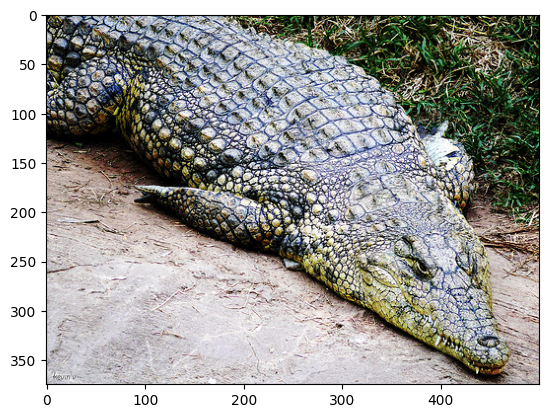

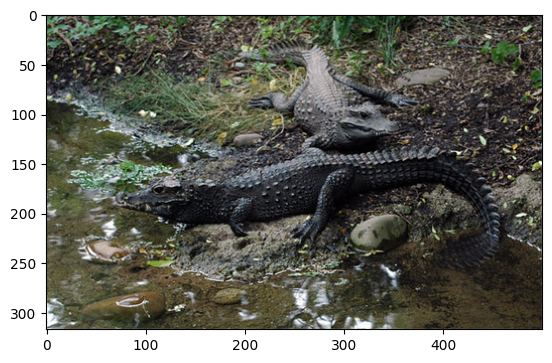

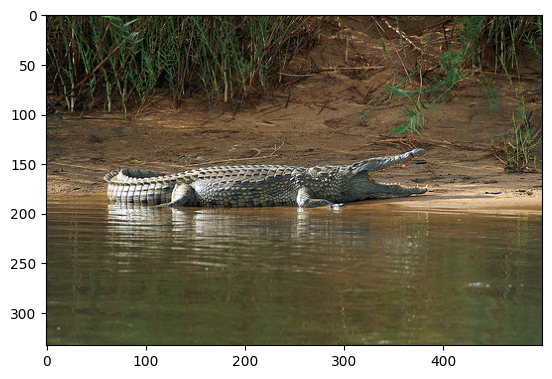

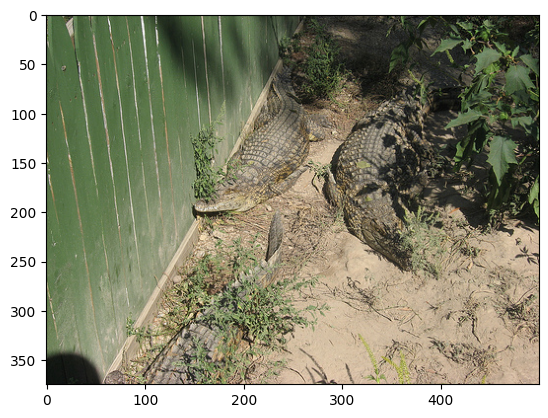

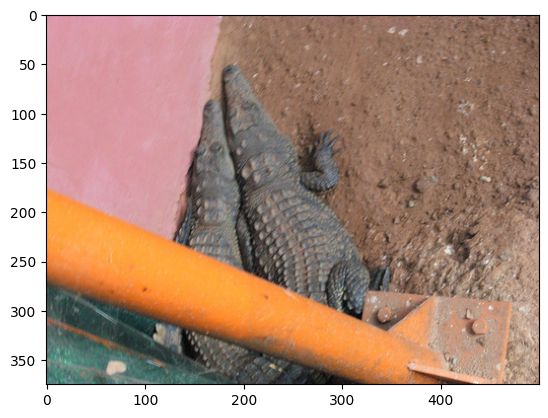

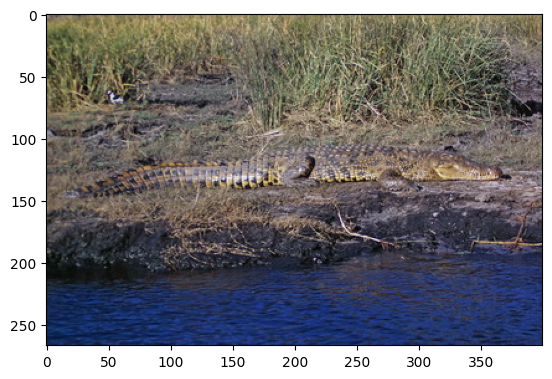

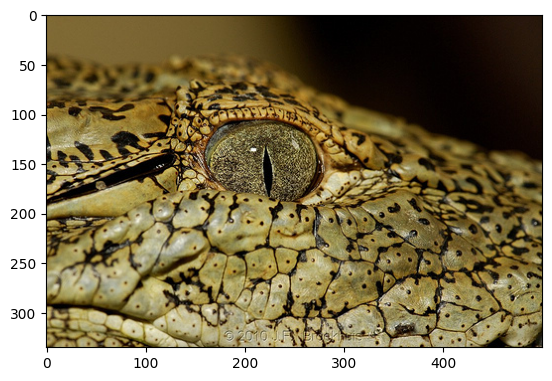

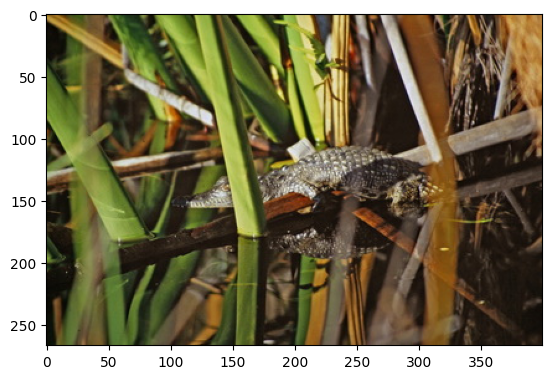

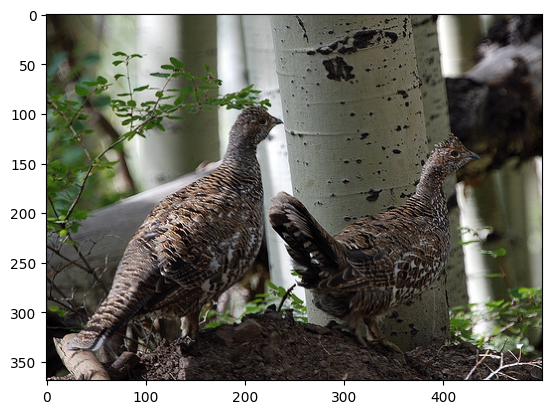

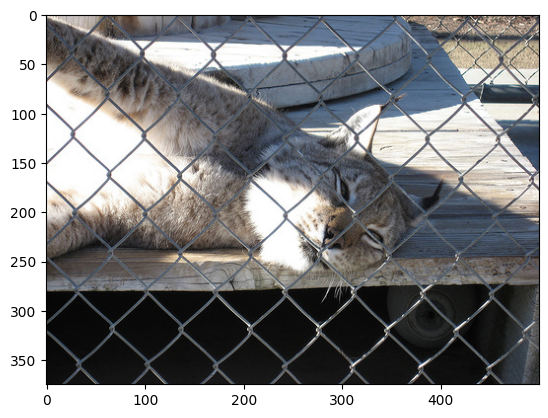

In [21]:
query_path = '/content/data/test/African_crocodile/n01697457_18534.JPEG'
result = search(query_path, l2_norm_collection, 10)
print(result)
top_10_id = result['ids'][0]
paths = get_all_train_path(POOL_PATH)
for i in top_10_id:
  img = plt.imread(paths[int(i.split('_')[1])])
  plt.imshow(img)
  plt.show()


In [ ]:
query_path = '/content/data/test/barn_spider/n01773549_3207.JPEG'
top_10_id = search(query_path, l2_norm_collection, 10)['ids'][0]
paths = get_all_train_path(POOL_PATH)
for i in top_10_id:
  img = plt.imread(paths[int(i.split('_')[1])])
  plt.imshow(img)
  plt.show()

Cosine similarity

{'ids': [['id_68', 'id_62', 'id_69', 'id_66', 'id_67', 'id_65', 'id_60', 'id_63', 'id_460', 'id_314']], 'distances': [[0.14269930124282837, 0.1649169921875, 0.22374331951141357, 0.2573654055595398, 0.2735731601715088, 0.3040688633918762, 0.31698018312454224, 0.33099639415740967, 0.3541209101676941, 0.3980703353881836]], 'metadatas': [[None, None, None, None, None, None, None, None, None, None]], 'embeddings': None, 'documents': [[None, None, None, None, None, None, None, None, None, None]], 'uris': None, 'data': None, 'included': ['metadatas', 'documents', 'distances']}


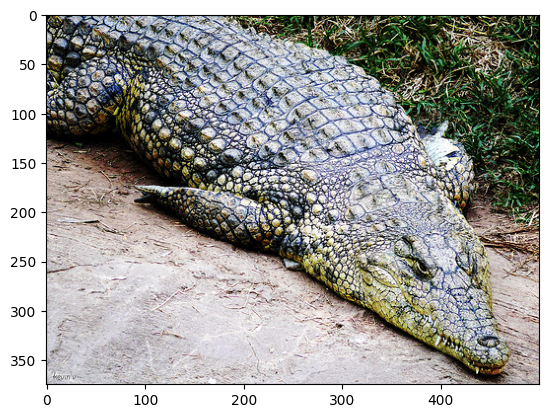

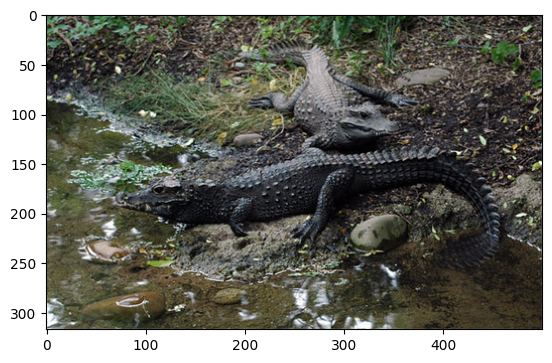

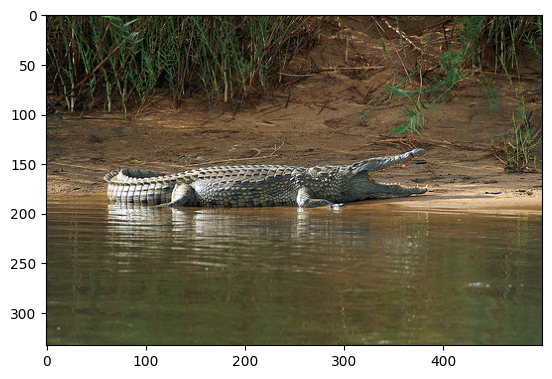

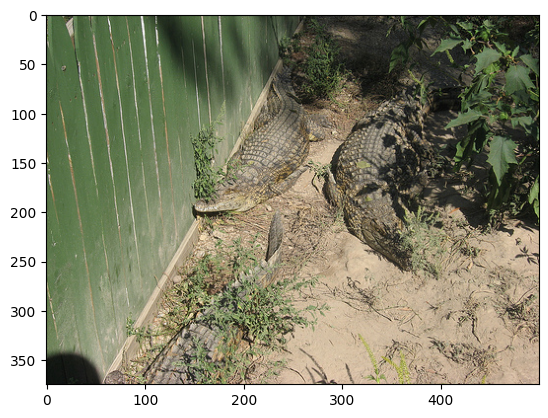

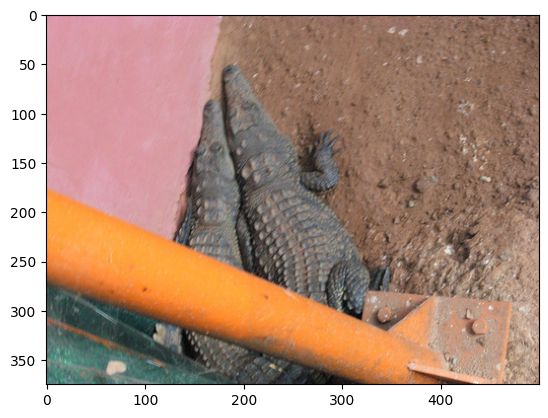

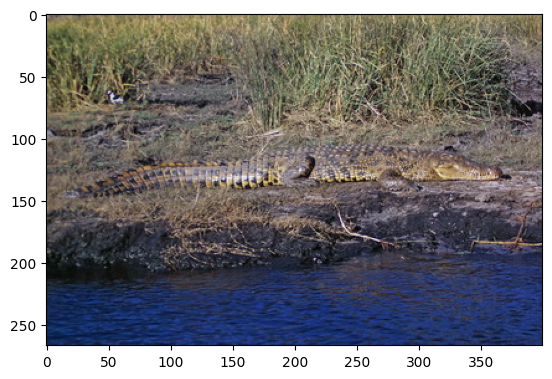

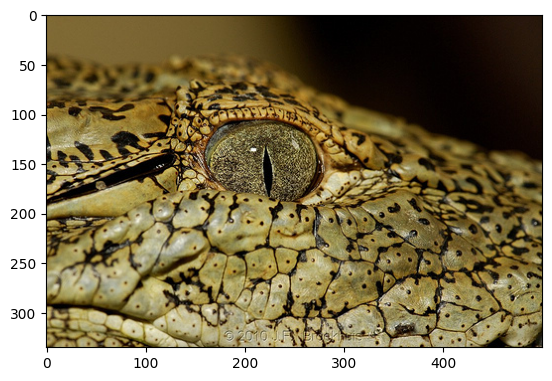

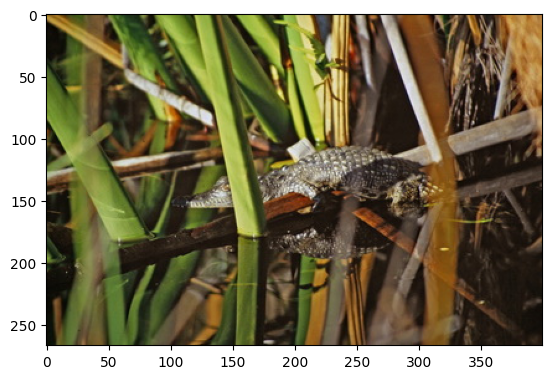

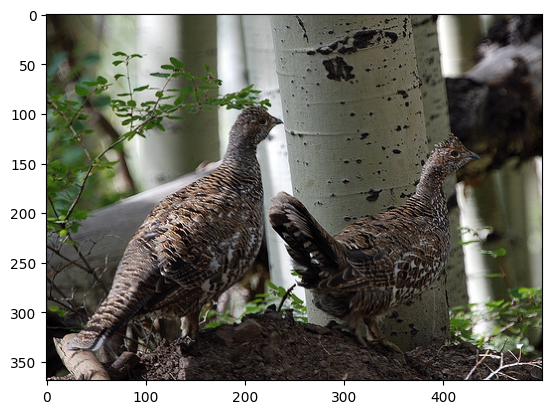

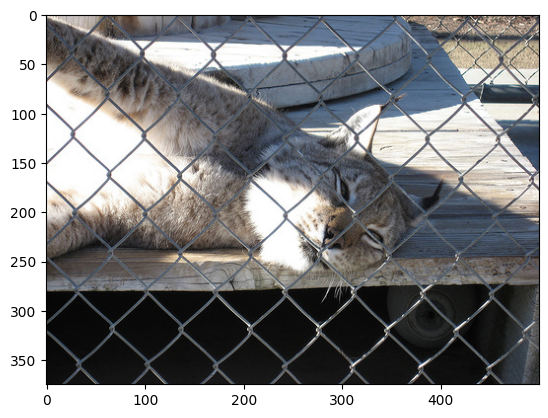

In [22]:
query_path = '/content/data/test/African_crocodile/n01697457_18534.JPEG'
result = search(query_path, cosine_similarity_collection, 10)
print(result)
top_10_id = result['ids'][0]
paths = get_all_train_path(POOL_PATH)
for i in top_10_id:
  img = plt.imread(paths[int(i.split('_')[1])])
  plt.imshow(img)
  plt.show()
